In [2]:
using LinearAlgebra, Statistics, CSV, DataFrames, Plots

In [3]:
function DM_LSS(z, H0, Ωb, Ωm ;del_z = 0.1)
    # z: redshift
    # H0: Hubble constant # km/s/Mpc
    # Ωm: matter density
    # returns: DM_LSS in pc/cm^3
    
    # constants
    G = 6.67408e-11 # m^3 kg^-1 s^-2
    c = 299792.458 # km/s
    m_p = 1.6726219e-27 # kg
    pc_in_cm = 3.08567758149137e18 # cm

    # parameters
    chi_e = 0.88
    fIGM = 0.84
    prefactor = chi_e*fIGM*3*c*Ωb*H0/(8*pi*m_p*G)

    # integration
    z_bins = collect(0:del_z:z)
    ez_bins = sqrt.(abs.(Ωm*(1 .+ z_bins).^3 .+ (1-Ωm)))
    
    dmlss =  prefactor*sum(((1 .+ z_bins)./ez_bins)*del_z) # pc^-1 m^-1
    dmlss = dmlss/(pc_in_cm*10)^2 # pc/cm^3

end

function DM_host(z;DM_host_avg = 100)
    return DM_host_avg/(1+z) # pc cm^-3
end

function DM_theo(z, H0, Ωb, Ωm,DM_host_avg ;del_z = 0.1)
    return DM_LSS(z, H0, Ωb, Ωm, del_z = del_z) + DM_host(z, DM_host_avg = DM_host_avg) # pc cm^-3     
end

function sigma_DM_sqr_i(z)
    return 30^2 + (50/(1+z))^2 + (40 + 140*z)^2 # (pc cm^-3)^2
end

function sigma_DM_sqr_i_no_MW(z)
    return (50 / (1 + z))^2 + (40 + 140 * z)^2 # (pc cm^-3)^2
end

function likelihood_i(DM_i, z_i, H0, DM_host_avg;Ωb = 0.0486, Ωm = 0.3089, del_z = 0.1)
    sigsq = sigma_DM_sqr_i_no_MW(z_i)
    return (2*pi*sigsq)^(-1/2)*exp(-(DM_i - DM_theo(z_i, H0, Ωb, Ωm, DM_host_avg, del_z = del_z))^2/(2*sigsq))
end

function log_likelihood_i(DM_i, z_i, H0, DM_host_avg;Ωb = 0.0486, Ωm = 0.3089, del_z = 0.1)
    return log(likelihood_i(DM_i, z_i, H0, DM_host_avg, Ωb = Ωb, Ωm = Ωm, del_z = del_z))
end

function log_likelihood(theta)
    H0, Ωm, Ωb, DM_host_avg = theta

    # CHIME FRBs
    chimefrbs = CSV.read("chimefrbcat.csv", DataFrame)
    DM_list = chimefrbs.DM_obs - chimefrbs.DM_MW_YMW16
    z_list = chimefrbs.redshift

    # likelihood estimate
    return sum([log_likelihood_i(DM_list[i], z_list[i], H0, DM_host_avg, Ωb = Ωb, Ωm = Ωm, del_z = 0.1) for i in 1:length(DM_list)])
end

function likelihood(theta)
    H0, Ωm, Ωb, DM_host_avg = theta

    # CHIME FRBs
    chimefrbs = CSV.read("chimefrbcat.csv", DataFrame)
    DM_list = chimefrbs.DM_obs - chimefrbs.DM_MW_YMW16
    z_list = chimefrbs.redshift

    # likelihood estimate
    return prod([likelihood_i(DM_list[i], z_list[i], H0, DM_host_avg, Ωb = Ωb, Ωm = Ωm, del_z = 0.1) for i in 1:length(DM_list)])
end

function log_likelihood_no_Omb(theta)
    H0, Ωm, DM_host_avg = theta

    # CHIME FRBs
    chimefrbs = CSV.read("chimefrbcat.csv", DataFrame)
    DM_list = chimefrbs.DM_obs - chimefrbs.DM_MW_YMW16
    z_list = chimefrbs.redshift

    # likelihood estimate
    return sum([log_likelihood_i(DM_list[i], z_list[i], H0, DM_host_avg, Ωb = 0.05, Ωm = Ωm, del_z = 0.1) for i in 1:length(DM_list)])
end

log_likelihood_no_Omb (generic function with 1 method)

## MCMC Sampling using the likelihood function

### 1. MCMC with only $H_0$, $\Omega_m$ and $\langle DM_{\text{host}} \rangle$  

In [63]:
using ProgressBars

# CHIME FRBs
chimefrbs = CSV.read("chimefrbcat.csv", DataFrame)
DM_list = chimefrbs.DM_obs - chimefrbs.DM_MW_YMW16
z_list = chimefrbs.redshift

function log_likelihood(theta;DM_list = DM_list, z_list = z_list)
    H0, Ωm, DM_host_avg = theta
    return sum([log_likelihood_i(DM_list[i], z_list[i], H0, DM_host_avg, Ωb=0.05, Ωm=Ωm, del_z=0.1) for i in 1:length(DM_list)])
end

logpdf(theta) = log_likelihood(theta; DM_list = DM_list, z_list = z_list)

nwalkers = 10
niters = 1E4
nburn = 1E2
ball_radius = [1E-3, 1E-4, 1E-2]
theta0 = [70, 0.25, 100] # initial guess

theta0s = [theta0 .+ ball_radius .* randn(3) for i in 1:nwalkers]

sampled_params = [Vector{Float64}[] for i in 1:nwalkers]

Threads.@threads for i in ProgressBar(1:nwalkers)
    theta = theta0s[i]
    for j in 1:niters
        theta_prop = theta .+ ball_radius .* randn(3)
        

        if rand() < exp(logpdf(theta_prop) - logpdf(theta))
            theta = theta_prop
        end
        if j > nburn
            push!(sampled_params[i], Vector(theta))
        end
    end
end

# make a matrix of the sampled parameters
sampled_params = vcat(sampled_params...)
sampled_params = reduce(hcat, sampled_params)

0.0%┣                                               ┫ 0/10 [00:00<00:-1, -0s/it]
10.0%┣████▏                                     ┫ 1/10 [00:00<Inf:Inf, InfGs/it]


20.0%┣█████████▍                                     ┫ 2/10 [00:09<01:12, 9s/it]


30.0%┣██████████████                                 ┫ 3/10 [00:17<01:01, 9s/it]


40.0%┣██████████████████▉                            ┫ 4/10 [00:26<00:51, 9s/it]


50.0%┣███████████████████████▌                       ┫ 5/10 [00:34<00:43, 9s/it]


60.0%┣████████████████████████████▏                  ┫ 6/10 [00:42<00:34, 8s/it]


70.0%┣█████████████████████████████████              ┫ 7/10 [00:50<00:25, 8s/it]


80.0%┣█████████████████████████████████████▋         ┫ 8/10 [00:59<00:17, 8s/it]


90.0%┣██████████████████████████████████████████▎    ┫ 9/10 [01:07<00:08, 8s/it]


100.0%┣█████████████████████████████████████████████┫ 10/10 [01:16<00:00, 8s/it]

3×99000 Matrix{Float64}:
 69.9881    69.9862    69.9852    …  69.5904    69.5898    69.5897
  0.250312   0.250254   0.250259      0.368382   0.368494   0.368567
 99.9308    99.9255    99.9495       94.9876    95.0063    94.9946

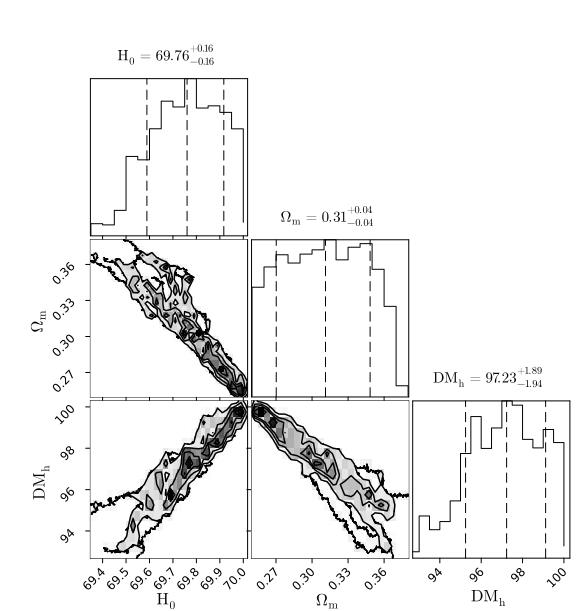

In [64]:
using Plots, DataFrames
using PairPlots

data_cp = DataFrame(H_0 = sampled_params[1,:], Ω_m = sampled_params[2,:], DM_h = sampled_params[3,:])

corner(data_cp, smooth = true, labels = ["H_0", "Ω_m", "DM_h"], color = :viridis, )

### 2. MCMC with $H_0$, $\Omega_m$, $\Omega_b$ and $\langle DM_{\text{host}} \rangle$  

In [19]:
using ProgressBars
# function logpdf(theta)
#     a, b, c, d = theta

#     return log(1/(2*pi*0.1)^2)*exp(-(a - 70)^2/(2*0.1^2)) + log(1/(2*pi*0.1)^2)*exp(-(b - 0.3)^2/(2*0.1^2)) + log(1/(2*pi*0.1)^2)*exp(-(c - 0.05)^2/(2*0.1^2)) + log(1/(2*pi*0.1)^2)*exp(-(d - 100)^2/(2*0.1^2))
# end

# CHIME FRBs
chimefrbs = CSV.read("chimefrbcat.csv", DataFrame)
DM_list = chimefrbs.DM_obs - chimefrbs.DM_MW_YMW16
z_list = chimefrbs.redshift

function log_likelihood(theta;DM_list = DM_list, z_list = z_list)
    H0, Ωm, Ωb, DM_host_avg = theta
    return sum([log_likelihood_i(DM_list[i], z_list[i], H0, DM_host_avg, Ωb=Ωb, Ωm=Ωm, del_z=0.1) for i in 1:length(DM_list)])
end

logpdf(theta) = log_likelihood(theta; DM_list = DM_list, z_list = z_list)

nwalkers = 10
niters = 1E4
nburn = 1E2
ball_radius = [1E-3, 1E-5, 1E-5, 1E-3]
theta0 = [70, 0.3, 0.05, 100] # initial guess

theta0s = [theta0 + ball_radius .* randn(4) for i in 1:nwalkers]

sampled_params = [Vector{Float64}[] for i in 1:nwalkers]

Threads.@threads for i in ProgressBar(1:nwalkers)
    theta = theta0s[i]
    for j in 1:niters
        theta_prop = theta + ball_radius .* randn(4)
        if rand() < exp(logpdf(theta_prop) - logpdf(theta))
            theta = theta_prop
        end
        if j > nburn
            push!(sampled_params[i], Vector(theta))
        end
    end
end

# make a matrix of the sampled parameters
sampled_params = vcat(sampled_params...)
sampled_params = reduce(hcat, sampled_params)

0.0%┣                                               ┫ 0/10 [00:00<00:-1, -0s/it]
10.0%┣████▏                                     ┫ 1/10 [00:00<Inf:Inf, InfGs/it]


20.0%┣█████████▏                                    ┫ 2/10 [00:10<01:20, 10s/it]


30.0%┣██████████████                                 ┫ 3/10 [00:19<01:05, 9s/it]


40.0%┣██████████████████▉                            ┫ 4/10 [00:27<00:55, 9s/it]


50.0%┣███████████████████████▌                       ┫ 5/10 [00:36<00:45, 9s/it]


60.0%┣████████████████████████████▏                  ┫ 6/10 [00:45<00:36, 9s/it]


70.0%┣█████████████████████████████████              ┫ 7/10 [00:53<00:27, 9s/it]


80.0%┣█████████████████████████████████████▋         ┫ 8/10 [01:03<00:18, 9s/it]


90.0%┣██████████████████████████████████████████▎    ┫ 9/10 [01:12<00:09, 9s/it]


100.0%┣█████████████████████████████████████████████┫ 10/10 [01:20<00:00, 9s/it]

4×99000 Matrix{Float64}:
  69.9876      69.9877      69.988      …   69.8015      69.801
   0.299944     0.299953     0.299957        0.300946     0.300948
   0.0495975    0.0495892    0.0495848       0.0219342    0.0219331
 100.01       100.009      100.01          100.167      100.165

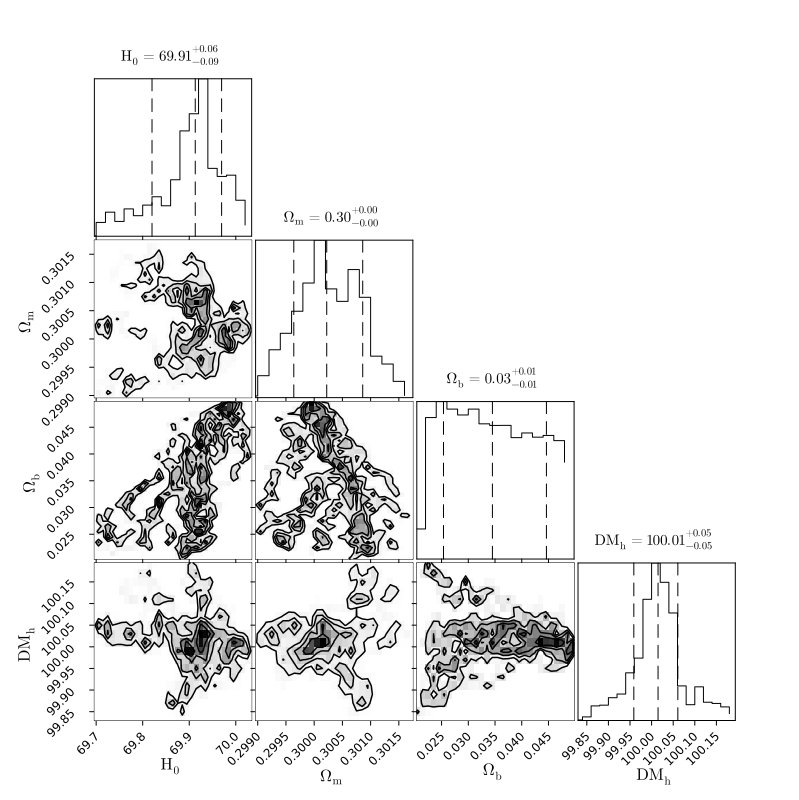

In [45]:
using Plots, DataFrames
using PairPlots

data_cp = DataFrame(H_0 = sampled_params[1,:], Ω_m = sampled_params[2,:], Ω_b = sampled_params[3,:], DM_h = sampled_params[4,:])


cplot = corner(data_cp, smooth=true, labels=["H_0", "Ω_m", "Ω_b", "DM_h"], plotscatter=false)
plot!(cplot, size=(800,800))